# Chi-Squared Analysis — $c_0$ from EXFOR Kinney/Smith fit, MF34 eval $\sigma$

Comparison of evaluated angular distributions (JEFF-4.0, JENDL-5, This work)
against EXFOR Fe-56 elastic data in $E\in[0.85, 4.0]$ MeV.

**Construction of $y_{\mathrm{eval}}$** (per `precompute_chi2_exfor_c0.py`):

- $a_l(E)$ — JEFF/JENDL: MF4 interpolated and truncated to $L=6$. This_work:
  Legendre coefficients $c_l(E)$ from the pipeline's `nominal_fits.parquet`,
  interpolated linearly in $E$ and truncated to $L=6$. All three libraries are
  compared at the same Legendre order.
- $c_0(E)$ — JEFF/JENDL: 1-parameter GLS fit to the K&S subentry data
  (Kinney 10571002 for $E<2.5$ MeV, Smith 10886002 for $2.5\le E<4$ MeV) with
  $a_l$ fixed, then interpolated in log-log between K&S energies. This_work:
  $c_0$ from `nominal_fits.parquet`.
- $\sigma_{\mathrm{eval}}(E,\mu)$ — MF34 sandwich on $a_l$ propagated to
  $d\sigma/d\Omega(\mu)$. **No** $c_0$ fit-error component (would partially
  double-count since the same data anchored the fit).

**Metric.** Per-experiment Mahalanobis $\chi^2$ with rank-1 systematic
correlation,

$$
\chi^2_e = r^T (D + uu^T)^{-1} r,\quad
D = \mathrm{diag}(\sigma_\mathrm{stat}^2 + \sigma_\mathrm{dep}^2 + \sigma_\mathrm{eval}^2),\
u = \sigma_\mathrm{indep},
$$

with $\sigma_\mathrm{indep}/\sigma_\mathrm{dep}$ taken from the EXFOR
uncertainty manifest's per-experiment systematic split.

**Six scenarios** = three data subsets × two variance budgets:

|  | $\sigma_\mathrm{exp}$ only | $\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$ |
|---|---|---|
| All experiments | 1a | 1b |
| Excluding K&S | 2a | 2b |
| Only K&S | 3a | 3b |

The "$\sigma_\mathrm{exp}$ only" rows zero out $\sigma_\mathrm{eval}$ in $D$
to test the nominal fit alone (how well do the libraries' angular shapes
match data given only experimental uncertainty?). The
"$\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$" rows include MF34 in $D$
to test whether the propagated covariance is wide enough to absorb the
residuals.


In [1]:
# ── Imports & Configuration ───────────────────────────────────────────────────

import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from pathlib import Path

# Local module — Mahalanobis chi^2 with rank-1 per-experiment systematic correlation.
sys.path.insert(0, str(Path(__file__).parent if '__file__' in globals() else '/home/MONLEON-JUAN/kika/scripts'))
import chi2_metrics

PARQUET_PATH = '/share_snc/snc/JuanMonleon/chi2/chi2_data_exfor_c0_72.parquet'
EVAL_COV_PATH = PARQUET_PATH + '.eval_cov.npz'
eval_cov = chi2_metrics.load_eval_cov(EVAL_COV_PATH)
print(f'Loaded {len(eval_cov)} per-(library, experiment) Sigma_eval blocks from {EVAL_COV_PATH}')

E_MIN = 0.85   # MeV
E_MAX = 4.0    # MeV

# Kinney (10571002) and Smith (10886002) — K&S anchor experiments.
KINNEY_SMITH_IDS = ['10571002', '10886002']

LIB_LABELS = {'JEFF': 'JEFF-4.0', 'JENDL': 'JENDL-5', 'This_work': 'This work'}
LIB_COLORS = {'JEFF': '#1f77b4', 'JENDL': '#2ca02c', 'This_work': '#d62728'}

plt.rcParams.update({
    'figure.dpi': 300, 'savefig.dpi': 300,
    'axes.grid': True, 'grid.alpha': 0.3,
    'font.size': 14, 'axes.labelsize': 15, 'axes.titlesize': 15,
    'legend.fontsize': 12, 'xtick.labelsize': 13, 'ytick.labelsize': 13,
})

SAVE_FIGURES = True
FIGURES_DIR = Path('/share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0')
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
FIGURE_FORMAT = 'png'
FIGURE_DPI = 300


def save_fig(fig, name):
    if SAVE_FIGURES:
        path = FIGURES_DIR / f'{name}.{FIGURE_FORMAT}'
        fig.savefig(path, dpi=FIGURE_DPI, bbox_inches='tight')
        print(f'Saved: {path}')


In [2]:
# ── Load + filter; residuals come from chi2_metrics ───────────────────────────

df_raw = pd.read_parquet(PARQUET_PATH)
print(f"Raw data: {len(df_raw)} rows")

libs_in_data = sorted(df_raw['library'].unique())
LIBRARIES = [lib for lib in libs_in_data if lib in LIB_LABELS]
print(f"Libraries detected: {[LIB_LABELS[lib] for lib in LIBRARIES]}")

df = df_raw[(df_raw['energy_mev'] >= E_MIN) & (df_raw['energy_mev'] <= E_MAX)].copy()
print(f"After energy filter [{E_MIN}, {E_MAX}] MeV: {len(df)} rows")

bad_mask = (df['sigma_exp'] <= 0) | ~np.isfinite(df['sigma_exp'])
n_bad = int(bad_mask.sum())
if n_bad > 0:
    print(f"Dropping {n_bad} rows with sigma_exp <= 0 or non-finite")
    df = df[~bad_mask].copy()

df['sigma_eval_diag'] = df['sigma_eval_diag'].fillna(0.0)

print(f"\nFinal dataset: {len(df)} rows")
print(f"Libraries: {df['library'].unique().tolist()}")
print(f"Experiments: {df['experiment_id'].nunique()}")

df['is_KS'] = df['experiment_id'].isin(KINNEY_SMITH_IDS)
print(f"\nRows by subset and library:")
for lib in LIBRARIES:
    sub = df[df['library'] == lib]
    n_all = len(sub)
    n_ks  = int(sub['is_KS'].sum())
    n_no  = n_all - n_ks
    print(f"  {LIB_LABELS[lib]:12s}  all={n_all}  no_KS={n_no}  only_KS={n_ks}")


Raw data: 140508 rows
Libraries detected: ['JEFF-4.0', 'JENDL-5', 'This work']
After energy filter [0.85, 4.0] MeV: 140508 rows
Dropping 231 rows with sigma_exp <= 0 or non-finite

Final dataset: 140277 rows
Libraries: ['JEFF', 'JENDL', 'This_work']
Experiments: 68

Rows by subset and library:
  JEFF-4.0      all=46759  no_KS=33061  only_KS=13698
  JENDL-5       all=46759  no_KS=33061  only_KS=13698
  This work     all=46759  no_KS=33061  only_KS=13698


In [3]:
# ── Mahalanobis scenario runner ───────────────────────────────────────────────
#
# One pipeline, one metric: per-experiment Mahalanobis chi^2 with rank-1
# systematic correlation from chi2_metrics.mahalanobis_chi2_per_experiment.
# Per-row contribution is z_i^2 (whitened residual squared); sum over an
# experiment equals chi^2_e (whitening identity, verified to 1e-14 rel).


def run_scenario(df_s, scenario_key, scenario_label, eval_cov_s):
    print(f"\n{'='*70}")
    print(f"SCENARIO {scenario_key}: {scenario_label}")
    print(f"{'='*70}")
    print(f"Data points: {len(df_s)}, Experiments: {df_s['experiment_id'].nunique()}")
    print(f"\nRows per library:")
    print(df_s.groupby('library').size().to_string())

    # Per-experiment Mahalanobis chi^2 + per-row whitened residuals.
    per_exp_raw = chi2_metrics.mahalanobis_chi2_per_experiment(df_s, eval_cov_s)
    z = chi2_metrics.whitened_residuals_per_experiment(df_s, eval_cov_s)

    # Decorate per-experiment table with author/year/E for plotting.
    meta = (
        df_s.groupby(['experiment_id', 'library'], observed=True)
            .agg(author=('author', 'first'),
                 year=('year', 'first'),
                 E_min=('energy_mev', 'min'),
                 E_max=('energy_mev', 'max'))
            .reset_index()
    )
    exp_df = per_exp_raw.merge(meta, on=['experiment_id', 'library'])
    exp_df['year'] = exp_df['year'].apply(lambda y: int(y) if pd.notna(y) else '')

    suffix = scenario_key
    n_libs = len(LIBRARIES)
    markers = {'JEFF': 'o', 'JENDL': 's', 'This_work': 'D'}
    year_offsets = {'JEFF': -0.3, 'JENDL': 0.0, 'This_work': 0.3}

    # 1. Global chi2/N bar
    summary = chi2_metrics.aggregate_chi2_by_library(per_exp_raw, LIB_LABELS)
    print(f"\n{summary[['Library', 'N', 'chi2_per_N']].to_string(index=False, float_format='%.3f')}")

    fig_w = max(5, 2 + n_libs * 1.2)
    fig, ax = plt.subplots(figsize=(fig_w, 4))
    labels = [LIB_LABELS[lib] for lib in LIBRARIES]
    values = [summary.loc[summary['library_key'] == lib, 'chi2_per_N'].values[0] for lib in LIBRARIES]
    colors = [LIB_COLORS[lib] for lib in LIBRARIES]
    bars = ax.bar(labels, values, color=colors, edgecolor='k', linewidth=0.5)
    ax.axhline(1.0, color='k', ls='--', lw=0.8, label=r'$\chi^2/N = 1$')
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                f'{val:.2f}', ha='center', va='bottom', fontsize=12)
    ax.set_ylabel(r'$\chi^2 / N$')
    ax.set_title(f'Scenario {scenario_key}: {scenario_label}')
    ax.legend()
    fig.tight_layout(); save_fig(fig, f'chi2_global_bar_{suffix}'); plt.show()

    # 2. Per-experiment chi^2/N pivot table
    pivot = exp_df.pivot_table(
        index=['experiment_id', 'author', 'year', 'E_min', 'E_max'],
        columns='library', values='chi2_per_N',
    )
    libs_in_pivot = [l for l in LIBRARIES if l in pivot.columns]
    pivot['avg'] = pivot[libs_in_pivot].mean(axis=1)
    pivot = pivot.sort_values('avg', ascending=False)
    n_per_exp = exp_df.groupby('experiment_id')['N'].first()
    pivot = pivot.join(n_per_exp, on='experiment_id')

    print(f"\nPer-experiment chi^2/N (sorted by avg, descending):\n")
    with pd.option_context('display.max_rows', 50, 'display.float_format', '{:.2f}'.format):
        display_cols = [c for c in pivot.columns if c != 'avg']
        print(pivot[display_cols].fillna('--').to_string())

    # 3. Per-experiment chi^2/N histogram
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs, 4.5), sharey=True, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        vals = exp_df.loc[exp_df['library'] == lib, 'chi2_per_N'].dropna()
        median_val = vals.median()
        ax.hist(vals, bins=max(5, len(vals) // 2), color=LIB_COLORS[lib],
                edgecolor='k', alpha=0.7)
        ax.axvline(1.0, color='k', ls='--', lw=1, label=r'$\chi^2/N=1$')
        ax.axvline(median_val, color='gray', ls=':', lw=1.2,
                   label=f'median = {median_val:.2f}')
        ax.set_xlabel(r'$\chi^2/N$'); ax.set_title(LIB_LABELS[lib]); ax.legend(fontsize=11)
    axes.flat[0].set_ylabel('Number of experiments')
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'chi2_per_experiment_histogram_{suffix}'); plt.show()

    # 4. Chi^2 contribution per experiment (%)
    CONTRIB_THRESHOLD = 1.0
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs + 1, 7), sharey=False, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        sub = exp_df[exp_df['library'] == lib].copy()
        total_chi2 = sub['chi2'].sum()
        sub['pct'] = 100.0 * sub['chi2'] / total_chi2
        above = sub[sub['pct'] >= CONTRIB_THRESHOLD].sort_values('pct', ascending=True)
        below = sub[sub['pct'] < CONTRIB_THRESHOLD]
        bar_labels = [f"{r['author']} ({r['year']})" for _, r in above.iterrows()]
        if len(below) > 0:
            bar_labels = [f'Other ({len(below)} exp.)'] + bar_labels
            vals = [below['pct'].sum()] + above['pct'].tolist()
            cols = ['#cccccc'] + [LIB_COLORS[lib]] * len(above)
        else:
            vals = above['pct'].tolist()
            cols = [LIB_COLORS[lib]] * len(above)
        ax.barh(bar_labels, vals, color=cols, edgecolor='k', linewidth=0.5)
        ax.set_xlabel(r'Contribution to total $\chi^2$ (%)')
        ax.set_title(LIB_LABELS[lib])
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'chi2_contribution_{suffix}'); plt.show()

    # 5. Cumulative chi^2 waterfall
    fig, ax = plt.subplots(figsize=(10, 5))
    for lib in LIBRARIES:
        sub = exp_df[exp_df['library'] == lib].sort_values('chi2', ascending=False).reset_index(drop=True)
        total = sub['chi2'].sum()
        sub['cum_pct'] = 100.0 * sub['chi2'].cumsum() / total
        ax.plot(range(1, len(sub) + 1), sub['cum_pct'], 'o-',
                color=LIB_COLORS[lib], label=LIB_LABELS[lib], markersize=5)
    ax.axhline(80, color='#333333', ls='--', lw=2.0, alpha=0.9, label='80%')
    ax.axhline(95, color='#333333', ls=':', lw=2.0, alpha=0.9, label='95%')
    ax.set_xlabel(r'Experiment rank (by $\chi^2$ contribution)')
    ax.set_ylabel(r'Cumulative $\chi^2$ (%)')
    ax.set_title(f'Scenario {scenario_key}'); ax.legend()
    fig.tight_layout(); save_fig(fig, f'chi2_waterfall_{suffix}'); plt.show()

    # 6. Chi^2/N vs publication year
    fig, ax = plt.subplots(figsize=(10, 5))
    for lib in LIBRARIES:
        sub = exp_df[exp_df['library'] == lib].copy()
        sub['year_num'] = pd.to_numeric(sub['year'], errors='coerce')
        sub = sub.dropna(subset=['year_num'])
        offset = year_offsets.get(lib, 0.0)
        ax.scatter(sub['year_num'] + offset, sub['chi2_per_N'],
                   c=LIB_COLORS[lib], marker=markers.get(lib, 'o'),
                   s=50, alpha=0.7, edgecolors='k', linewidths=0.3,
                   label=LIB_LABELS[lib], zorder=3)
    ax.axvspan(1982, 2016, alpha=0.10, color='gray', zorder=0)
    ax.axhline(1.0, color='k', ls='--', lw=0.8, label=r'$\chi^2/N = 1$')
    ax.set_xlabel('Publication year'); ax.set_ylabel(r'$\chi^2 / N$')
    ax.set_yscale('log'); ax.set_title(f'Scenario {scenario_key}'); ax.legend()
    fig.tight_layout(); save_fig(fig, f'chi2_vs_year_{suffix}'); plt.show()

    # 7. Whitened-residual statistics (target N(0,1) under correct covariance)
    df_z = df_s.assign(z=z.values)
    res_rows = []
    for lib in LIBRARIES:
        zr = df_z.loc[df_z['library'] == lib, 'z'].values
        res_rows.append({
            'Library': LIB_LABELS[lib],
            'mean': np.mean(zr), 'std': np.std(zr, ddof=1),
            'skewness': stats.skew(zr), 'kurtosis': stats.kurtosis(zr),
            '|z|>2 (%)': 100.0 * np.mean(np.abs(zr) > 2),
            '|z|>3 (%)': 100.0 * np.mean(np.abs(zr) > 3),
        })
    res_df = pd.DataFrame(res_rows)
    print(f"\nWhitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, "
          f"|z|>2: 4.6%, |z|>3: 0.3%)\n")
    print(res_df.to_string(index=False, float_format='%.3f'))

    # 8. Whitened-residual histograms with N(0,1) overlay
    x_grid = np.linspace(-6, 6, 300)
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs, 4.5), sharey=True, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        zr = df_z.loc[df_z['library'] == lib, 'z'].values
        mu_fit, sigma_fit = stats.norm.fit(zr)
        ax.hist(zr, bins=80, density=True, color=LIB_COLORS[lib],
                edgecolor='k', linewidth=0.3, alpha=0.7, label=LIB_LABELS[lib])
        ax.plot(x_grid, stats.norm.pdf(x_grid, 0, 1), 'k--', lw=2.0, label=r'$\mathcal{N}(0,1)$')
        ax.plot(x_grid, stats.norm.pdf(x_grid, mu_fit, sigma_fit), 'r-', lw=1.5,
                label=f'fit $\mathcal{{N}}$({mu_fit:.2f},{sigma_fit:.2f})')
        ax.set_xlabel('Whitened residual $z$', fontsize=15); ax.set_xlim(-6, 6); ax.legend(fontsize=12)
    axes.flat[0].set_ylabel('Density', fontsize=15)
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'whitened_residual_histograms_{suffix}'); plt.show()

    # 9. Whitened residual vs energy scatter
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs, 4.5), sharey=True, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        sub = df_z[df_z['library'] == lib]
        ax.scatter(sub['energy_mev'], sub['z'], s=3, alpha=0.2,
                   color=LIB_COLORS[lib], rasterized=True)
        ax.axhline(0, color='k', lw=0.8)
        ax.axhline(2, color='gray', ls='--', lw=0.6, alpha=0.7)
        ax.axhline(-2, color='gray', ls='--', lw=0.6, alpha=0.7)
        ax.set_xscale('log'); ax.set_xlabel('Energy (MeV)'); ax.set_title(LIB_LABELS[lib])
    axes.flat[0].set_ylabel('Whitened residual $z$')
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'whitened_residual_vs_energy_{suffix}'); plt.show()

    return summary[['Library', 'library_key', 'N', 'chi2_per_N']]


<>:170: SyntaxWarning: invalid escape sequence '\m'
<>:170: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_2397/592329619.py:170: SyntaxWarning: invalid escape sequence '\m'
  label=f'fit $\mathcal{{N}}$({mu_fit:.2f},{sigma_fit:.2f})')


In [4]:
# ── Subsets used for the 6 scenarios ──────────────────────────────────────────

df_all     = df.copy()
df_no_KS   = df[~df['is_KS']].copy()
df_only_KS = df[ df['is_KS']].copy()

print(f"all     : {len(df_all):>6d} rows, {df_all['experiment_id'].nunique()} experiments")
print(f"no_KS   : {len(df_no_KS):>6d} rows, {df_no_KS['experiment_id'].nunique()} experiments")
print(f"only_KS : {len(df_only_KS):>6d} rows, {df_only_KS['experiment_id'].nunique()} experiments")


all     : 140277 rows, 68 experiments
no_KS   :  99183 rows, 66 experiments
only_KS :  41094 rows, 2 experiments


## Scenario 1a — All experiments, σ_exp only



SCENARIO 1a: All experiments, σ_exp only
Data points: 140277, Experiments: 68

Rows per library:
library
JEFF         46759
JENDL        46759
This_work    46759

  Library     N  chi2_per_N
 JEFF-4.0 46759    1438.683
  JENDL-5 46759    1522.103
This work 46759     569.046
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_global_bar_1a.png


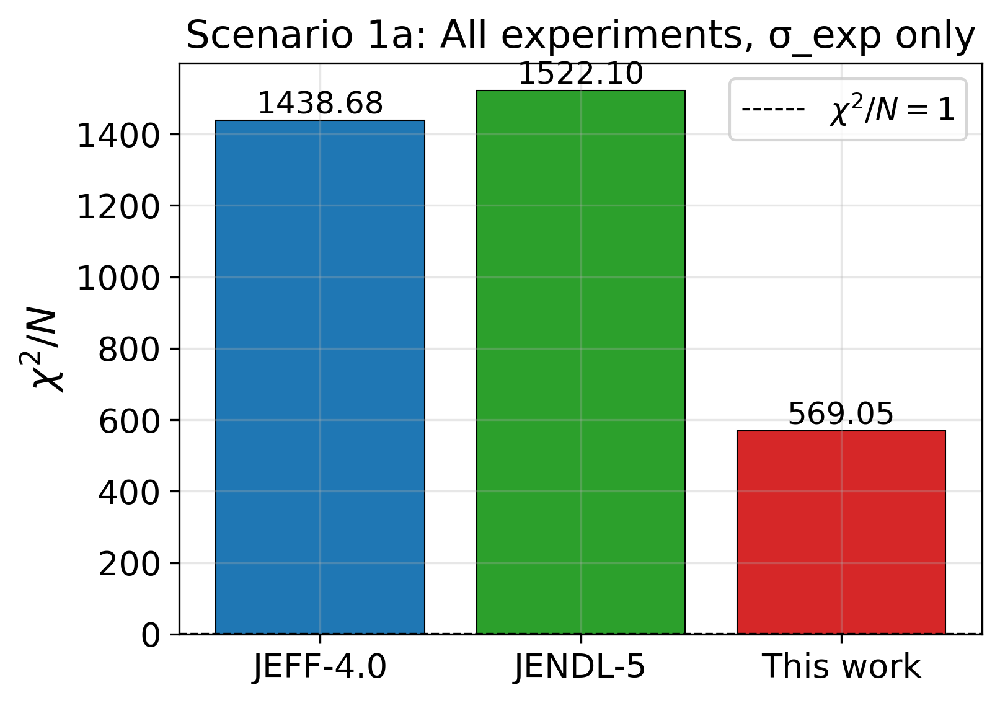


Per-experiment chi^2/N (sorted by avg, descending):

                                               JEFF     JENDL  This_work      N
experiment_id author     year E_min E_max                                      
20482005      Cabe       1967 0.97  0.97  395558.55 586721.71   22074.56     11
11519016      Cox        1966 0.86  1.23  160648.64 162949.74   67411.41    368
10332004      Cox        1972 0.90  0.90  100948.12 167280.10   13261.73      8
11717002      Landon     1958 2.20  2.20   52150.43  57411.75   13519.14     14
13511004      Perey      1991 0.85  0.85   34076.19  41776.95   30981.86     18
11638003      Darden     1955 1.00  1.55   27959.24  35644.93    5070.03      6
20008013      Tomita     1973 1.94  1.94    3491.70   4958.62     209.35     14
20008003      Tomita     1973 1.47  1.47    2472.00   3695.38     602.22     13
20008004      Tomita     1973 1.56  1.56    1824.49   2422.26      69.17     13
20008015      Tomita     1973 2.04  2.04     936.28   1480.56     

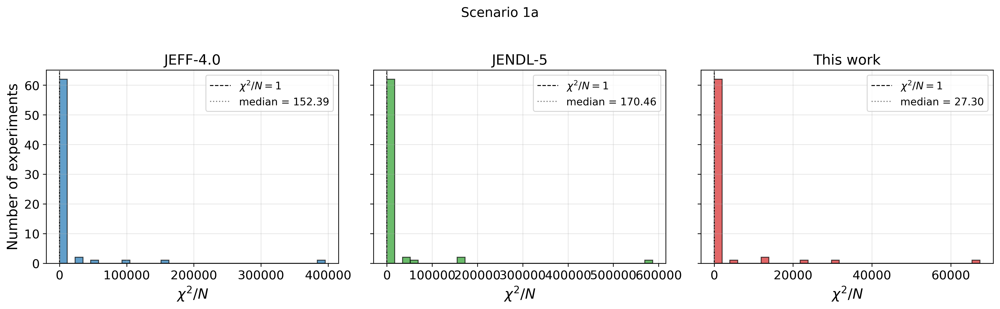

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_contribution_1a.png


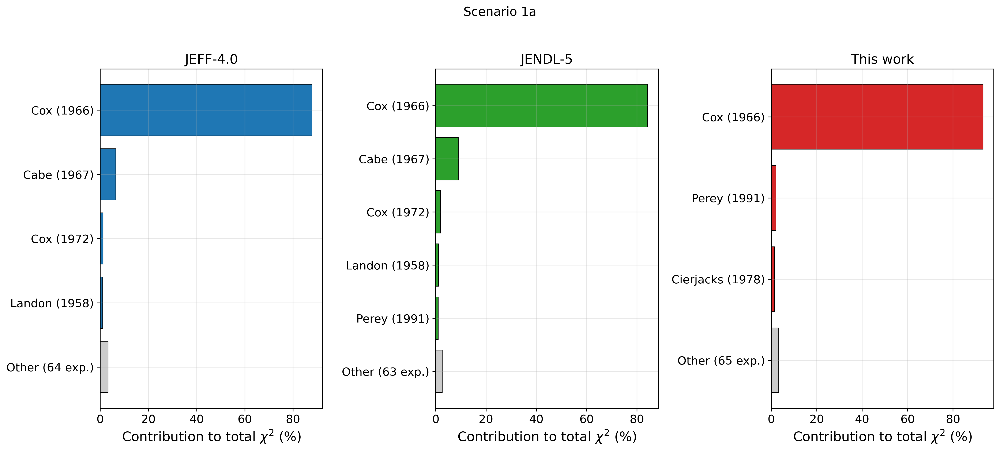

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_waterfall_1a.png


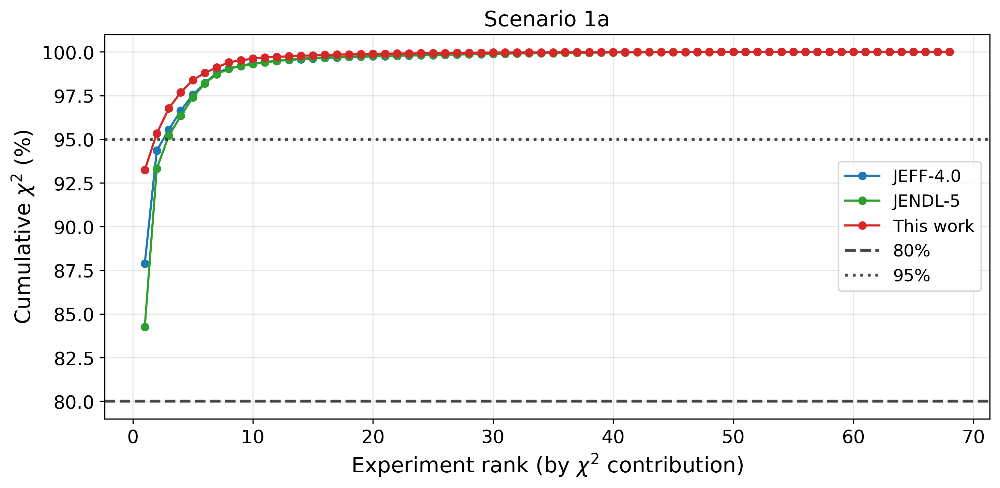

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_vs_year_1a.png


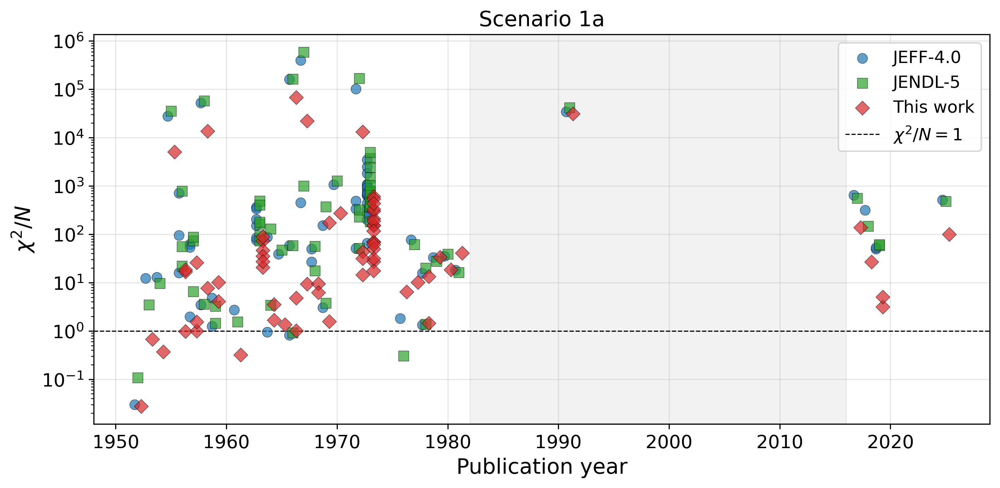


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean    std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 0.849 37.921    -3.447   318.815     44.468     32.398
  JENDL-5 0.179 39.014    -2.139   321.634     46.968     36.791
This work 0.142 23.855     0.957   387.302     46.460     31.581
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_histograms_1a.png


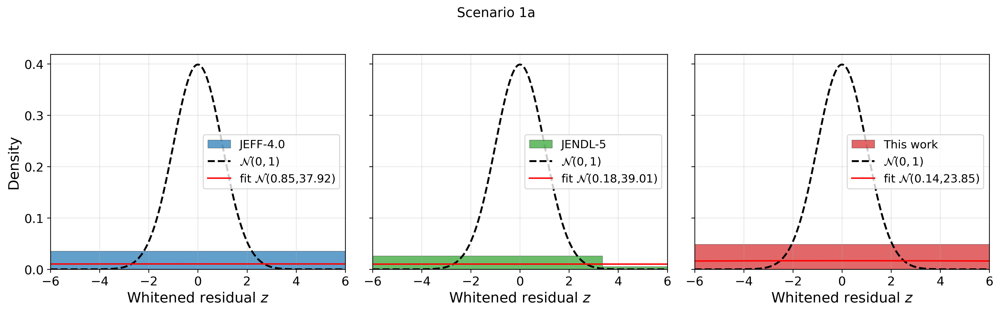

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_vs_energy_1a.png


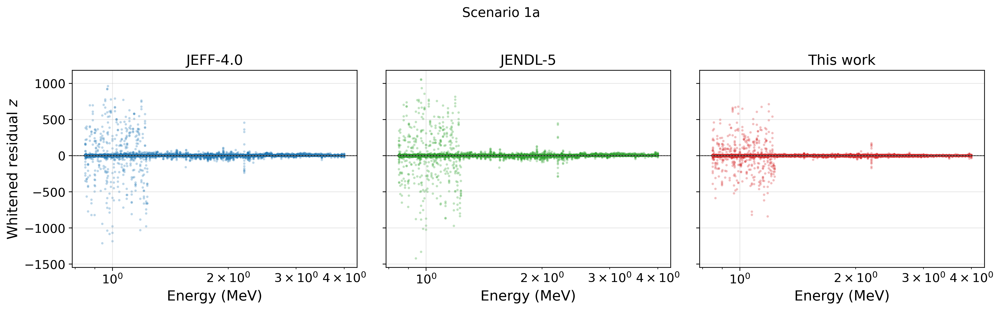

In [5]:
summary_1a = run_scenario(
    df_s=df_all,
    scenario_key='1a',
    scenario_label='All experiments, σ_exp only',
    eval_cov_s=None,
)


## Scenario 1b — All experiments, σ_exp ⊕ σ_eval



SCENARIO 1b: All experiments, σ_exp ⊕ σ_eval
Data points: 140277, Experiments: 68

Rows per library:
library
JEFF         46759
JENDL        46759
This_work    46759

  Library     N  chi2_per_N
 JEFF-4.0 46759       7.223
  JENDL-5 46759       9.479
This work 46759       5.521
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_global_bar_1b.png


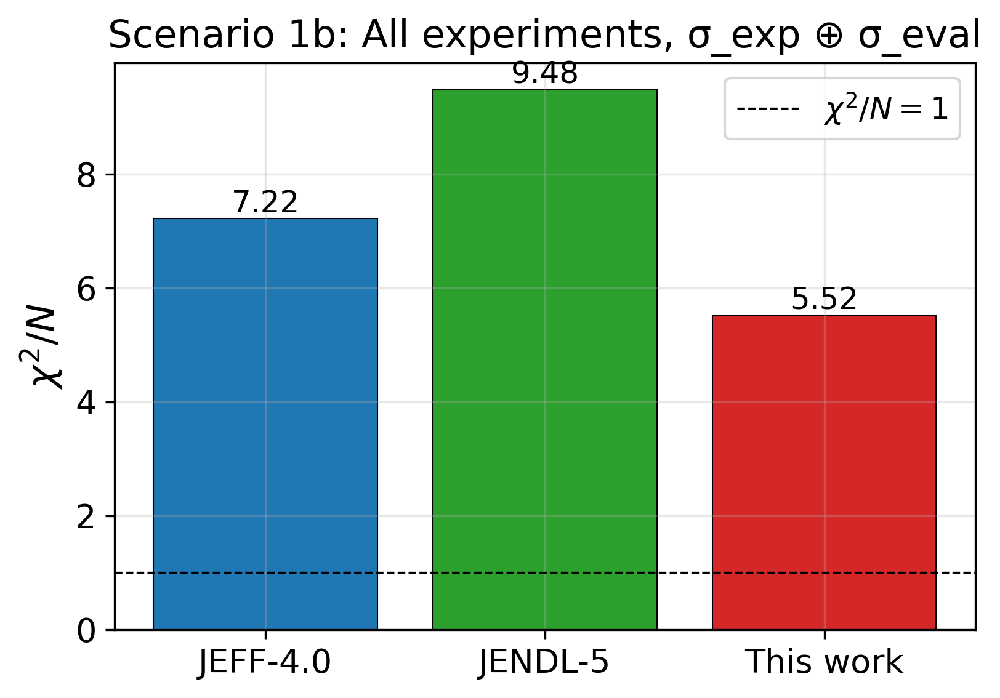


Per-experiment chi^2/N (sorted by avg, descending):

                                            JEFF   JENDL  This_work      N
experiment_id author     year E_min E_max                                 
13511004      Perey      1991 0.85  0.85    3.33 1559.37      10.28     18
11519016      Cox        1966 0.86  1.23   30.61  234.19      23.79    368
11121009      Wells      1963 0.85  0.98   11.95  150.47       7.00     26
20008015      Tomita     1973 2.04  2.04  108.11   48.53       6.10     13
20008002      Tomita     1973 1.43  1.43   16.74  119.45       3.62     13
20020012      Holmqvist  1970 1.77  2.76   34.88   79.62       5.72     92
11396011      Cranberg   1956 2.25  2.45   77.25   41.20       1.06      7
11276009      Rodgers    1967 2.33  2.33   74.19   40.99       0.33      5
20482005      Cabe       1967 0.97  0.97   85.65   16.25       5.14     11
11717002      Landon     1958 2.20  2.20   43.76   54.23       3.83     14
11121006      Wells      1963 0.85  0.97   44.

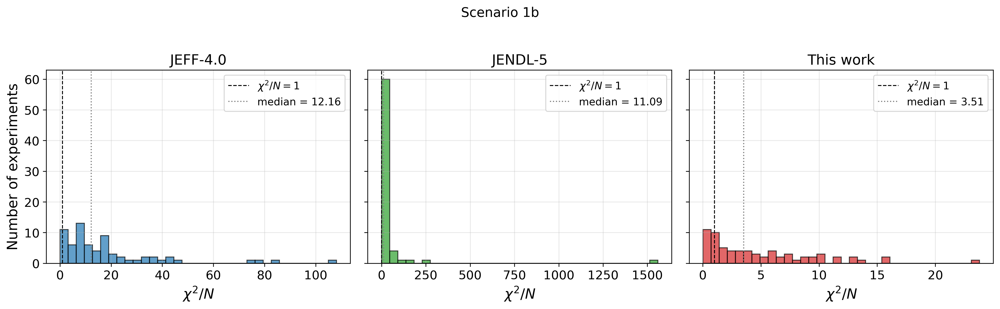

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_contribution_1b.png


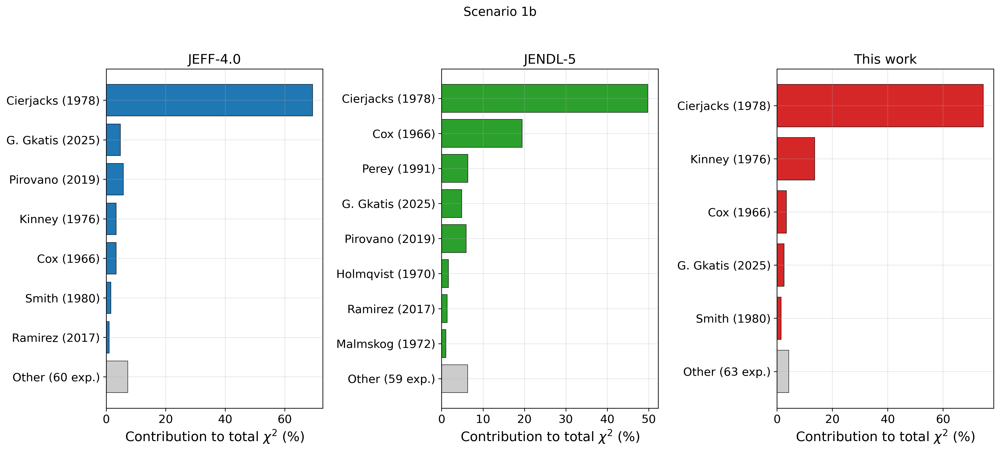

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_waterfall_1b.png


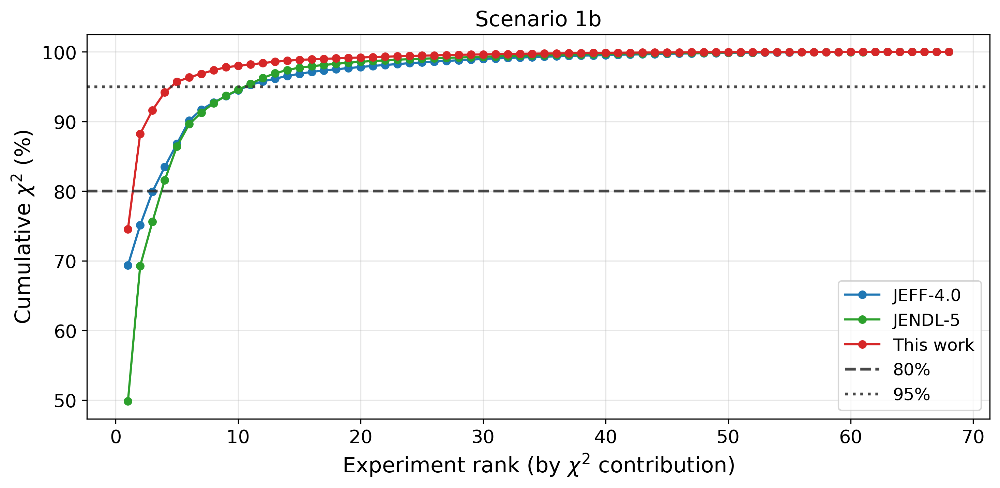

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_vs_year_1b.png


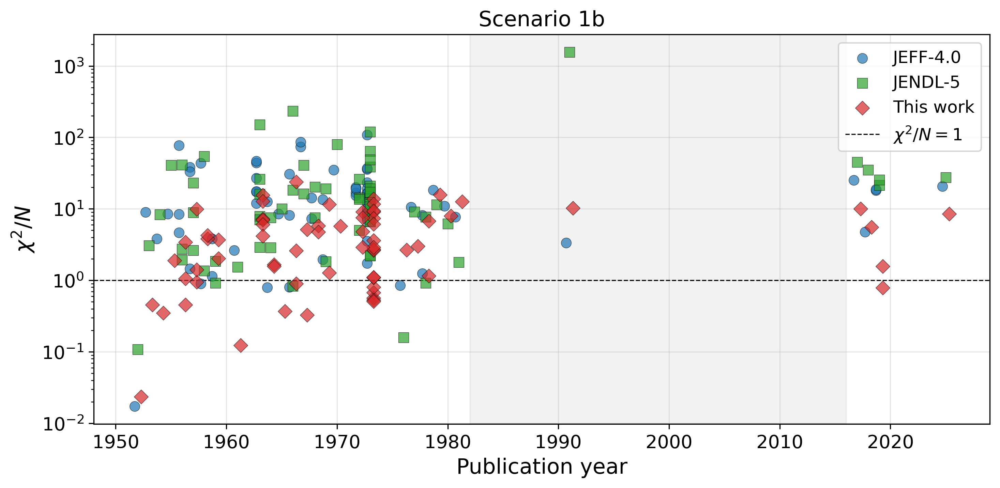


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 0.656 2.606     0.568     7.237     31.517     19.977
  JENDL-5 0.112 3.077     1.188   200.416     31.893     18.174
This work 0.151 2.345     0.053     2.868     31.934     17.979
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_histograms_1b.png


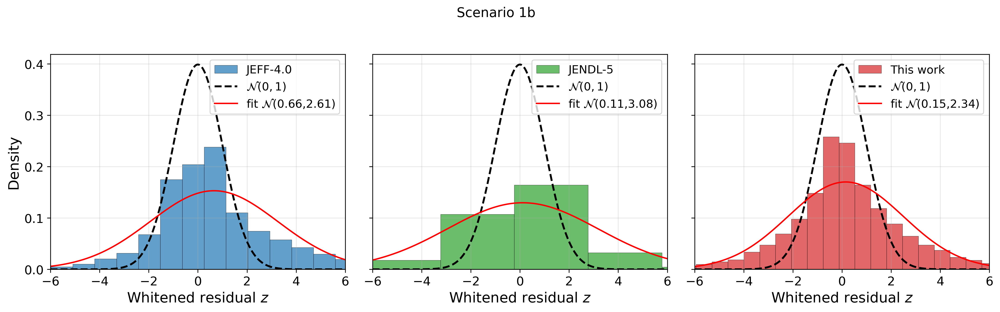

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_vs_energy_1b.png


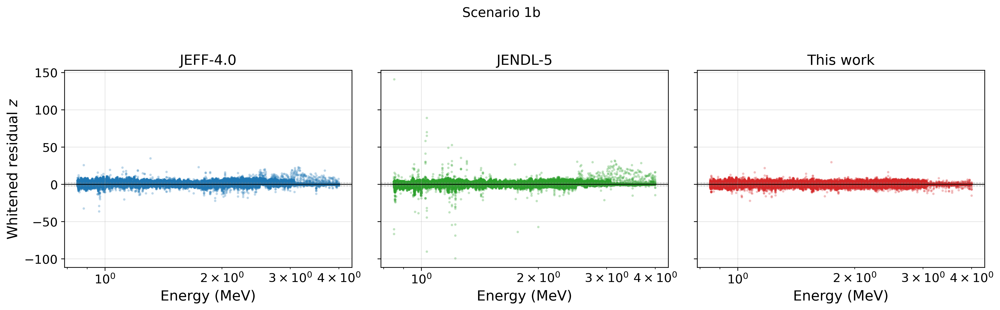

In [6]:
summary_1b = run_scenario(
    df_s=df_all,
    scenario_key='1b',
    scenario_label='All experiments, σ_exp ⊕ σ_eval',
    eval_cov_s=eval_cov,
)


## Scenario 2a — Excluding K&S, σ_exp only



SCENARIO 2a: Excluding K&S, σ_exp only
Data points: 99183, Experiments: 66

Rows per library:
library
JEFF         33061
JENDL        33061
This_work    33061

  Library     N  chi2_per_N
 JEFF-4.0 33061    2033.514
  JENDL-5 33061    2152.048
This work 33061     801.984
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_global_bar_2a.png


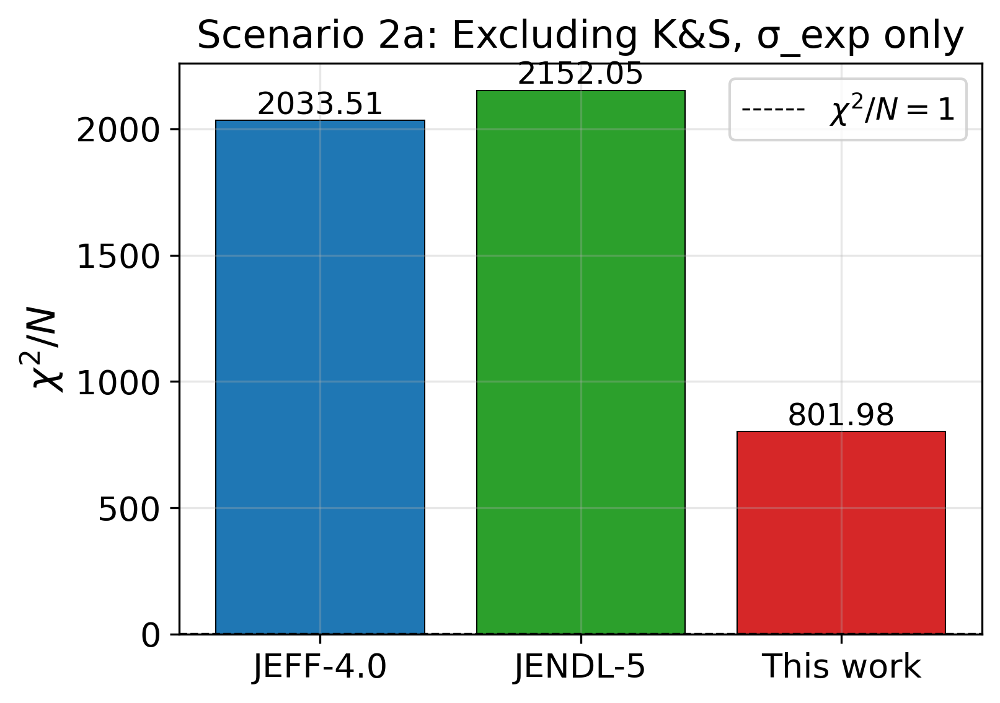


Per-experiment chi^2/N (sorted by avg, descending):

                                               JEFF     JENDL  This_work      N
experiment_id author     year E_min E_max                                      
20482005      Cabe       1967 0.97  0.97  395558.55 586721.71   22074.56     11
11519016      Cox        1966 0.86  1.23  160648.64 162949.74   67411.41    368
10332004      Cox        1972 0.90  0.90  100948.12 167280.10   13261.73      8
11717002      Landon     1958 2.20  2.20   52150.43  57411.75   13519.14     14
13511004      Perey      1991 0.85  0.85   34076.19  41776.95   30981.86     18
11638003      Darden     1955 1.00  1.55   27959.24  35644.93    5070.03      6
20008013      Tomita     1973 1.94  1.94    3491.70   4958.62     209.35     14
20008003      Tomita     1973 1.47  1.47    2472.00   3695.38     602.22     13
20008004      Tomita     1973 1.56  1.56    1824.49   2422.26      69.17     13
20008015      Tomita     1973 2.04  2.04     936.28   1480.56     

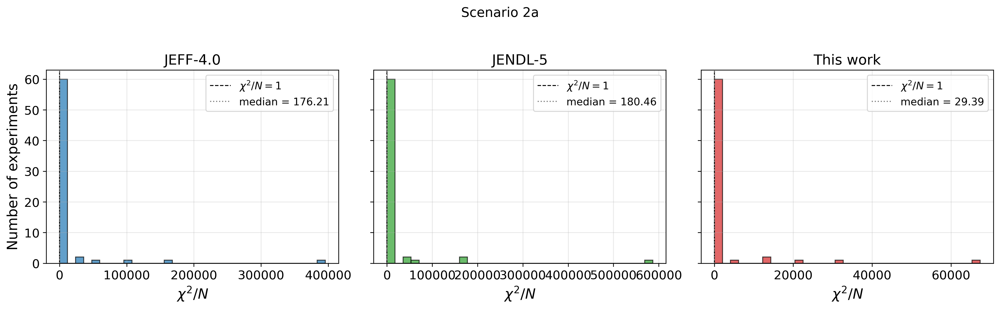

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_contribution_2a.png


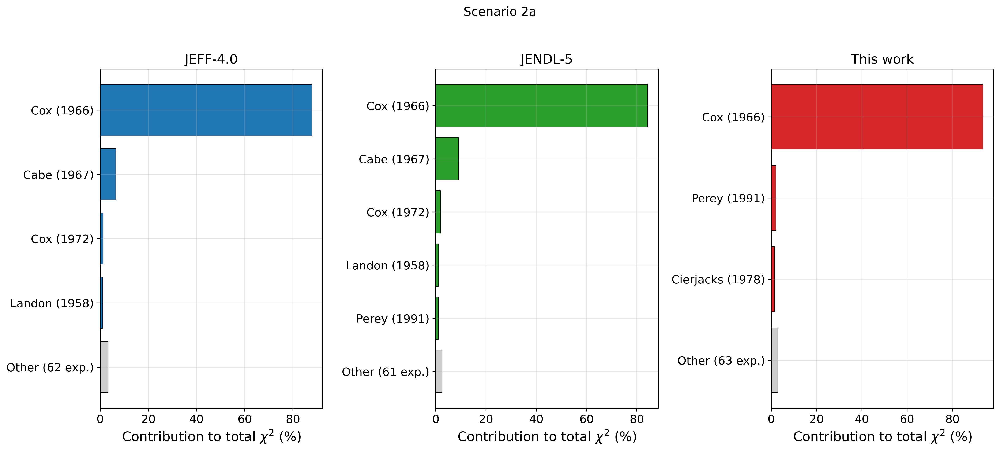

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_waterfall_2a.png


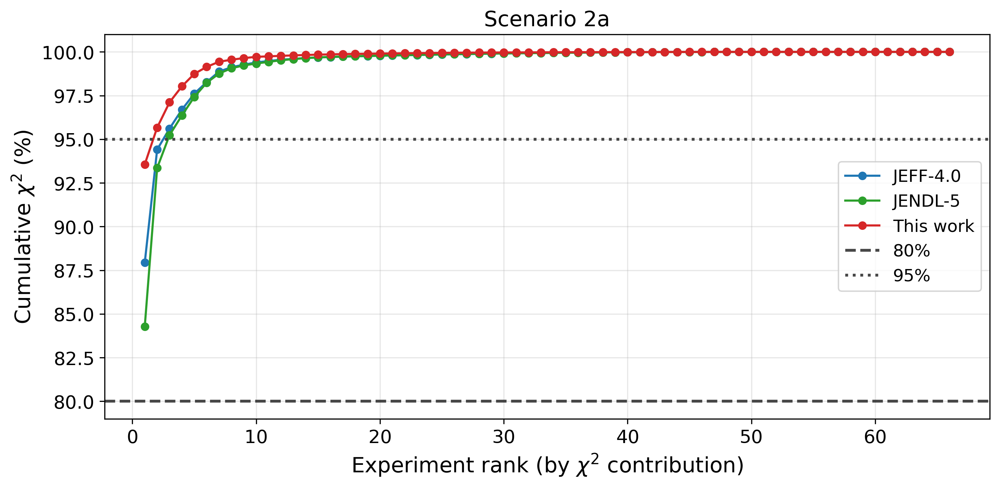

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_vs_year_2a.png


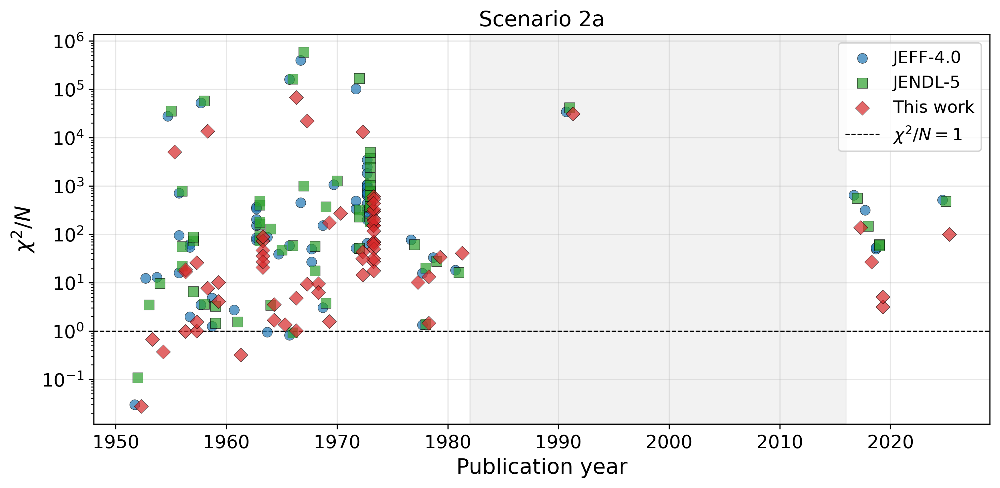


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean    std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 1.205 45.079    -2.925   225.009     60.155     44.893
  JENDL-5 0.254 46.390    -1.804   226.698     65.542     51.505
This work 0.194 28.319     0.804   274.916     52.781     37.382
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_histograms_2a.png


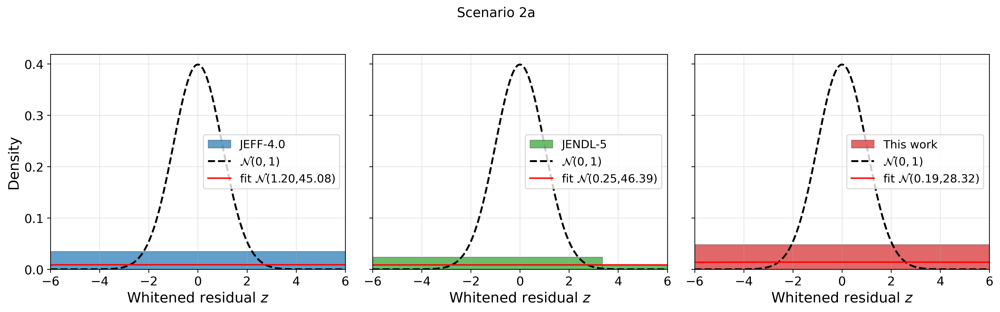

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_vs_energy_2a.png


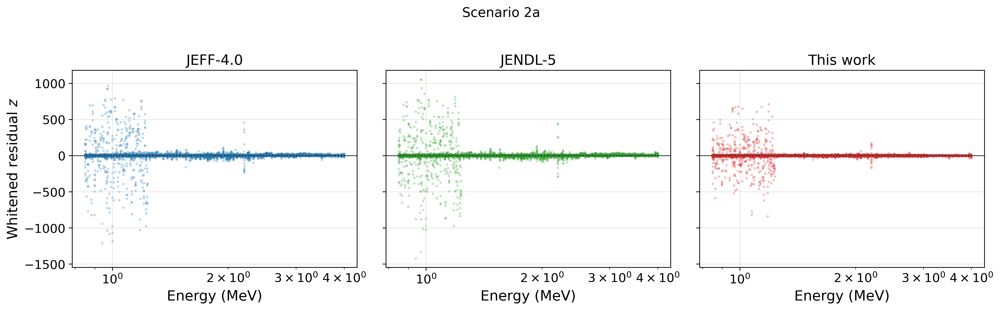

In [7]:
summary_2a = run_scenario(
    df_s=df_no_KS,
    scenario_key='2a',
    scenario_label='Excluding K&S, σ_exp only',
    eval_cov_s=None,
)


## Scenario 2b — Excluding K&S, σ_exp ⊕ σ_eval



SCENARIO 2b: Excluding K&S, σ_exp ⊕ σ_eval
Data points: 99183, Experiments: 66

Rows per library:
library
JEFF         33061
JENDL        33061
This_work    33061

  Library     N  chi2_per_N
 JEFF-4.0 33061       9.713
  JENDL-5 33061      13.253
This work 33061       6.622
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_global_bar_2b.png


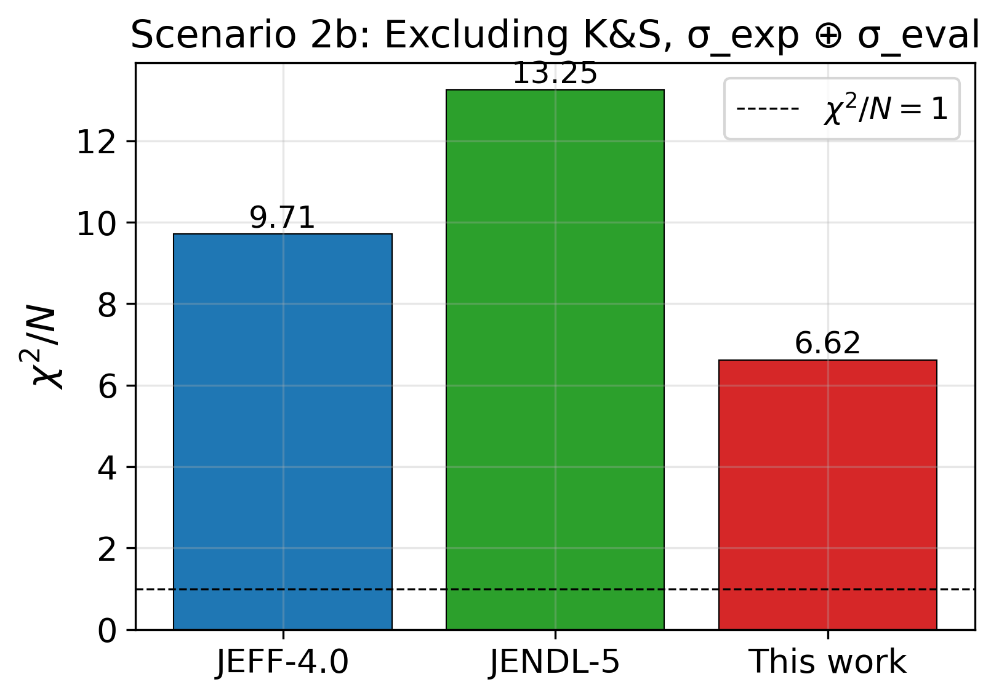


Per-experiment chi^2/N (sorted by avg, descending):

                                            JEFF   JENDL  This_work      N
experiment_id author     year E_min E_max                                 
13511004      Perey      1991 0.85  0.85    3.33 1559.37      10.28     18
11519016      Cox        1966 0.86  1.23   30.61  234.19      23.79    368
11121009      Wells      1963 0.85  0.98   11.95  150.47       7.00     26
20008015      Tomita     1973 2.04  2.04  108.11   48.53       6.10     13
20008002      Tomita     1973 1.43  1.43   16.74  119.45       3.62     13
20020012      Holmqvist  1970 1.77  2.76   34.88   79.62       5.72     92
11396011      Cranberg   1956 2.25  2.45   77.25   41.20       1.06      7
11276009      Rodgers    1967 2.33  2.33   74.19   40.99       0.33      5
20482005      Cabe       1967 0.97  0.97   85.65   16.25       5.14     11
11717002      Landon     1958 2.20  2.20   43.76   54.23       3.83     14
11121006      Wells      1963 0.85  0.97   44.

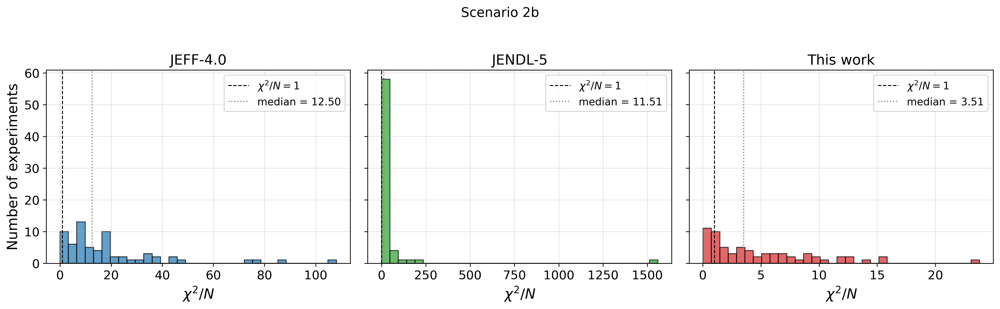

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_contribution_2b.png


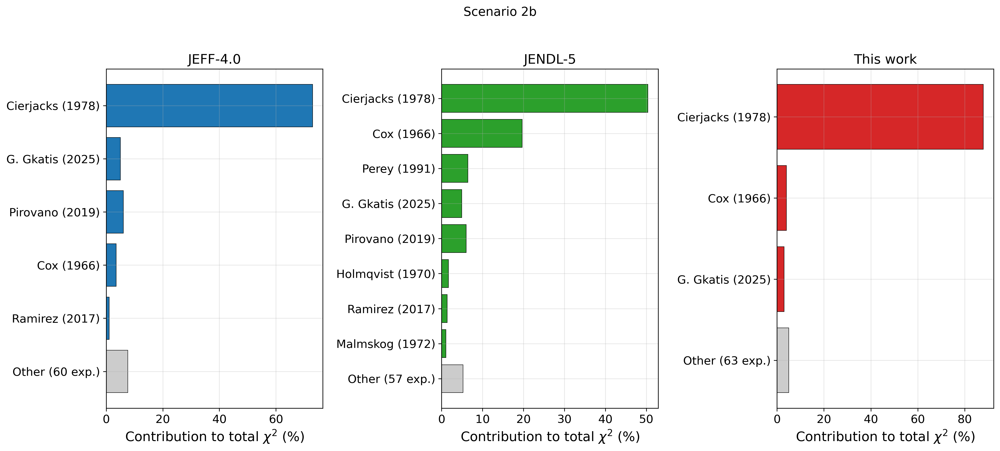

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_waterfall_2b.png


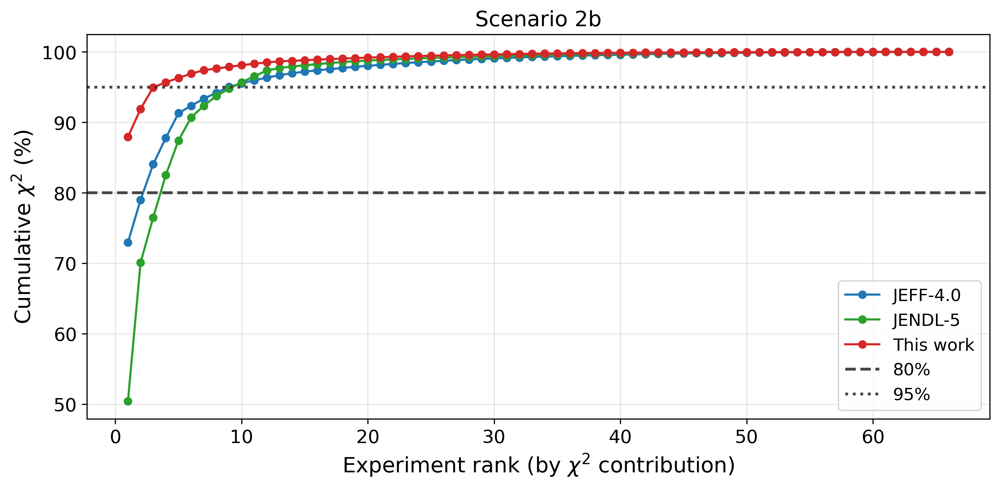

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_vs_year_2b.png


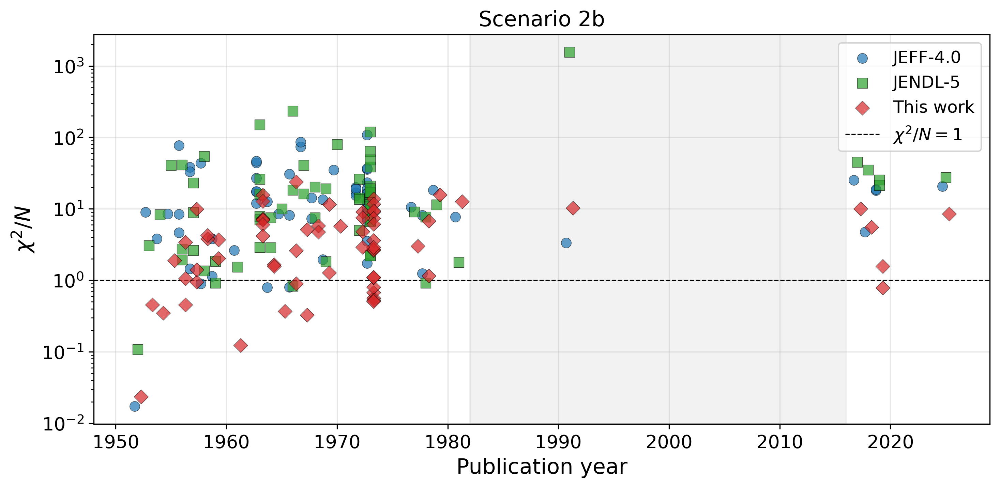


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 0.944 2.970     0.317     4.992     43.898     27.939
  JENDL-5 0.167 3.637     0.967   144.254     44.739     25.504
This work 0.247 2.562    -0.023     1.798     37.712     22.056
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_histograms_2b.png


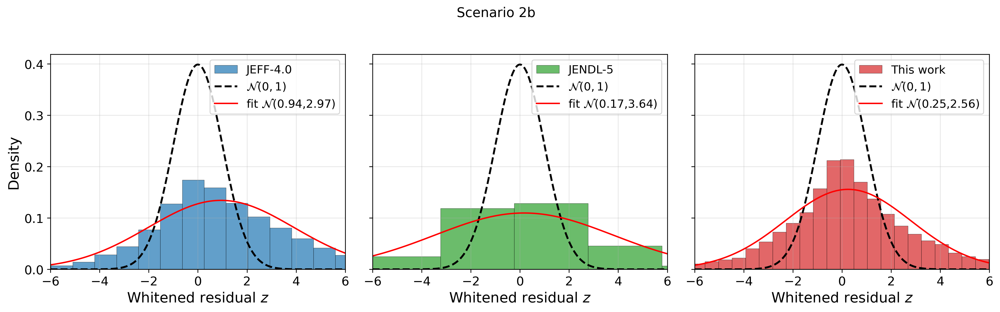

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_vs_energy_2b.png


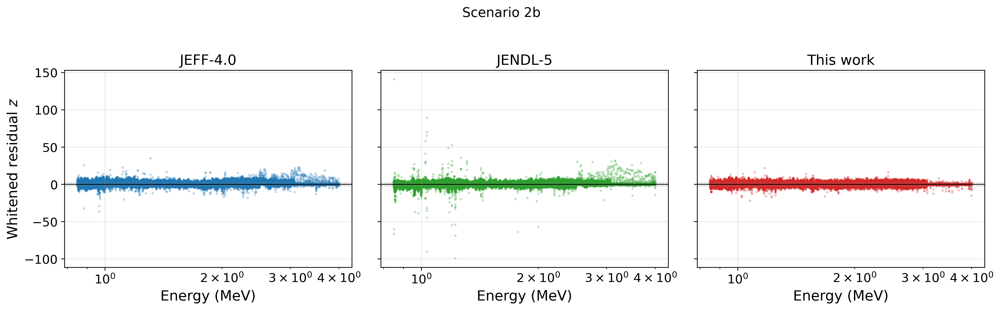

In [8]:
summary_2b = run_scenario(
    df_s=df_no_KS,
    scenario_key='2b',
    scenario_label='Excluding K&S, σ_exp ⊕ σ_eval',
    eval_cov_s=eval_cov,
)


## Scenario 3a — Only K&S, σ_exp only



SCENARIO 3a: Only K&S, σ_exp only
Data points: 41094, Experiments: 2

Rows per library:
library
JEFF         13698
JENDL        13698
This_work    13698

  Library     N  chi2_per_N
 JEFF-4.0 13698       3.021
  JENDL-5 13698       1.690
This work 13698       6.833
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_global_bar_3a.png


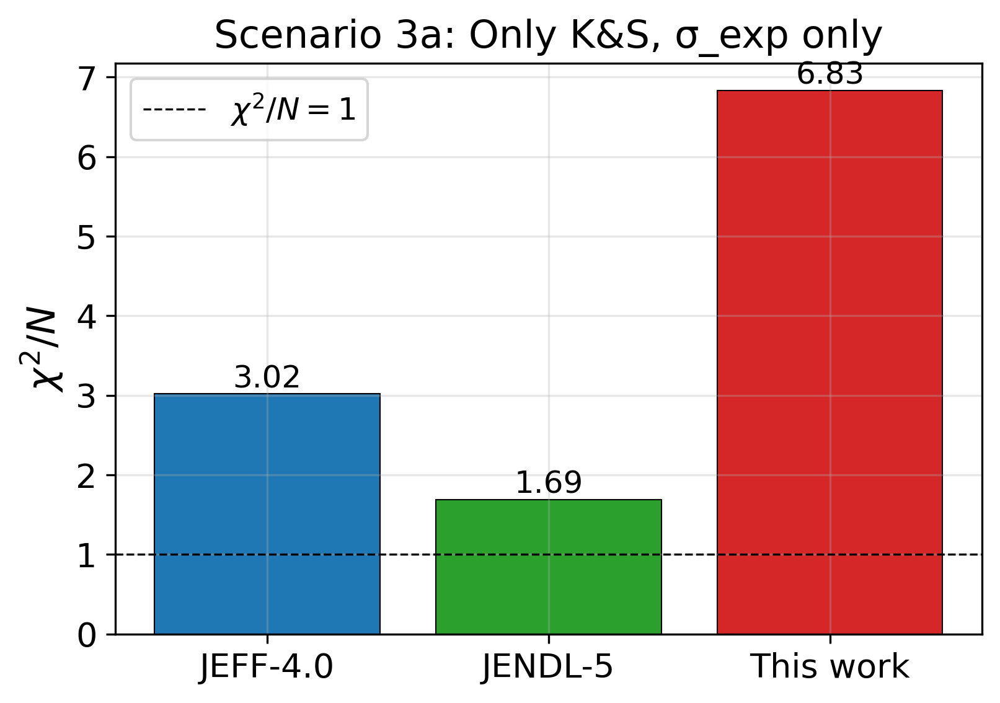


Per-experiment chi^2/N (sorted by avg, descending):

                                       JEFF  JENDL  This_work      N
experiment_id author year E_min E_max                               
10886002      Smith  1980 1.68  3.90  35.52  39.08      18.44    490
10571002      Kinney 1976 0.85  2.50   1.82   0.30       6.40  13208
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_per_experiment_histogram_3a.png


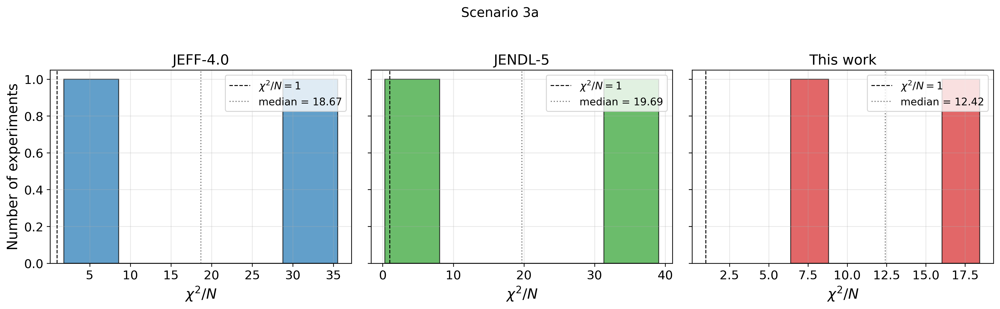

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_contribution_3a.png


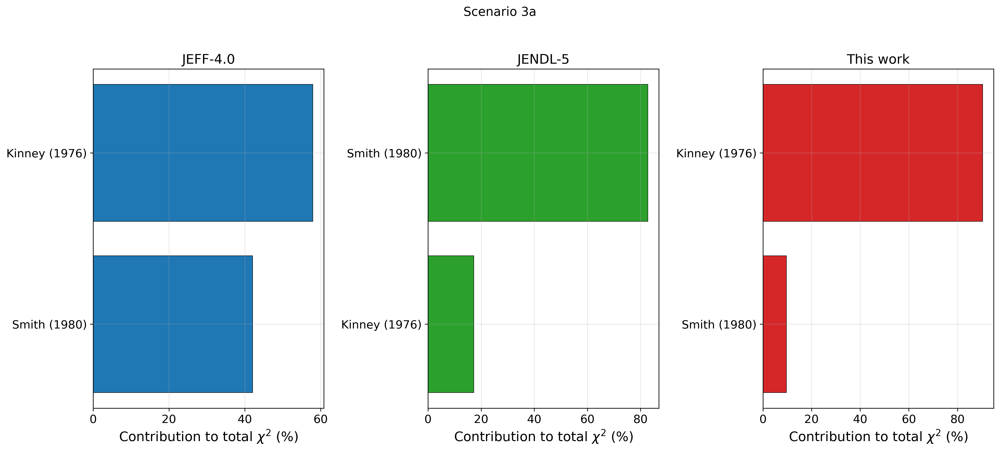

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_waterfall_3a.png


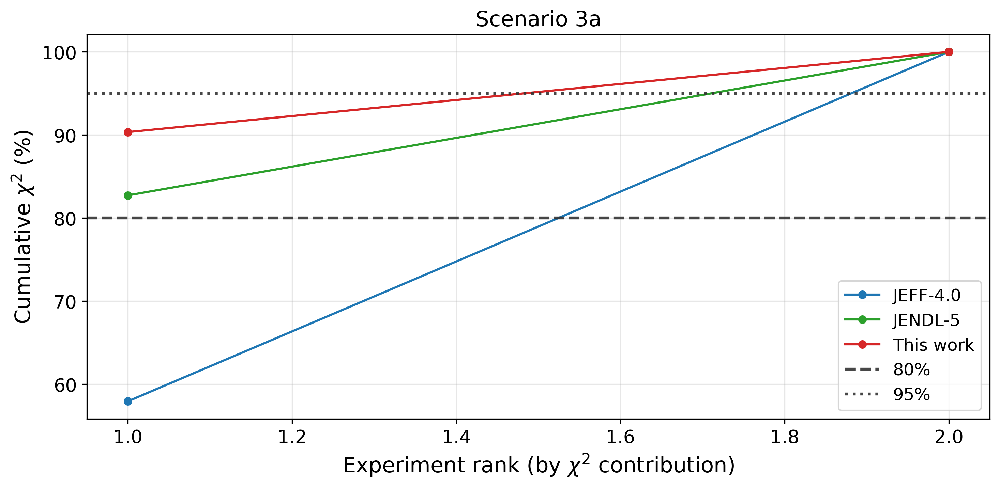

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_vs_year_3a.png


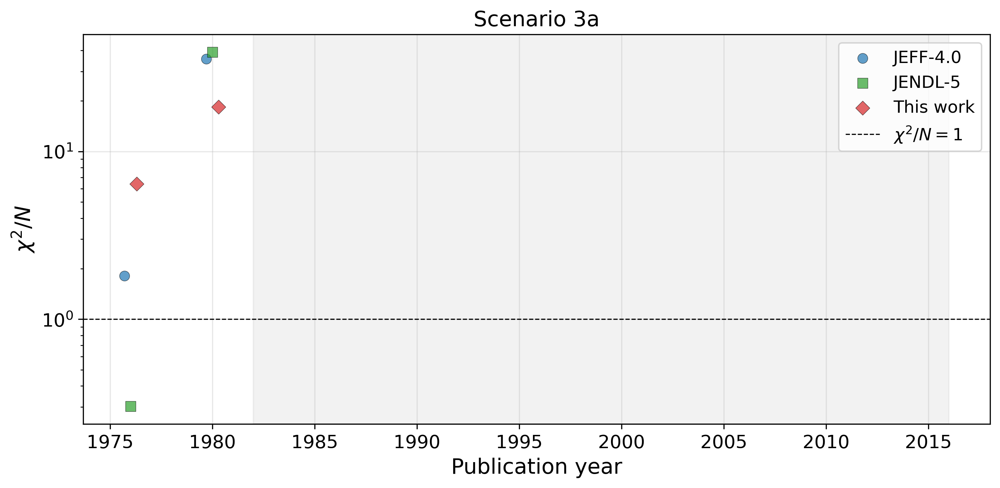


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library   mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 -0.010 1.738    -3.029   101.621      6.607      2.241
  JENDL-5 -0.001 1.300    -7.388   284.747      2.139      1.278
This work  0.016 2.614    -1.014     6.075     31.202     17.579
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_histograms_3a.png


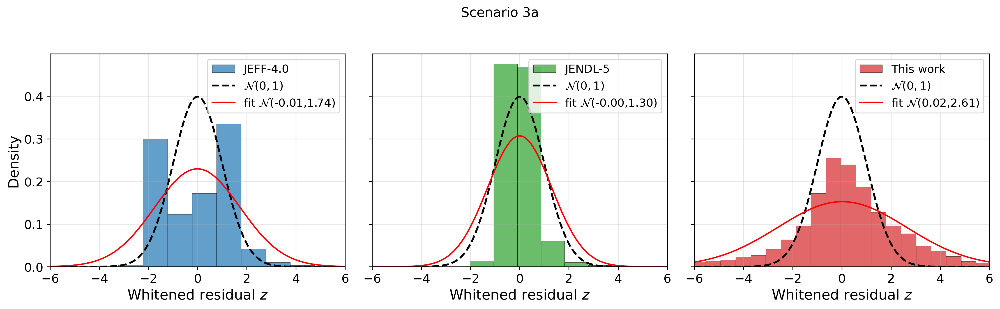

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_vs_energy_3a.png


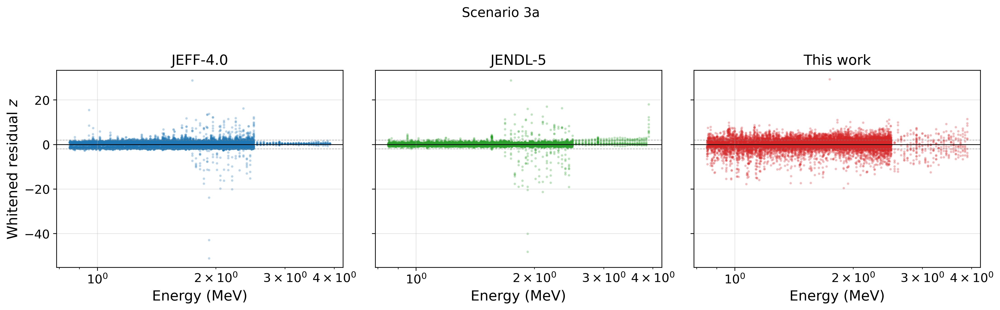

In [9]:
summary_3a = run_scenario(
    df_s=df_only_KS,
    scenario_key='3a',
    scenario_label='Only K&S, σ_exp only',
    eval_cov_s=None,
)


## Scenario 3b — Only K&S, σ_exp ⊕ σ_eval



SCENARIO 3b: Only K&S, σ_exp ⊕ σ_eval
Data points: 41094, Experiments: 2

Rows per library:
library
JEFF         13698
JENDL        13698
This_work    13698

  Library     N  chi2_per_N
 JEFF-4.0 13698       1.215
  JENDL-5 13698       0.373
This work 13698       2.862
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_global_bar_3b.png


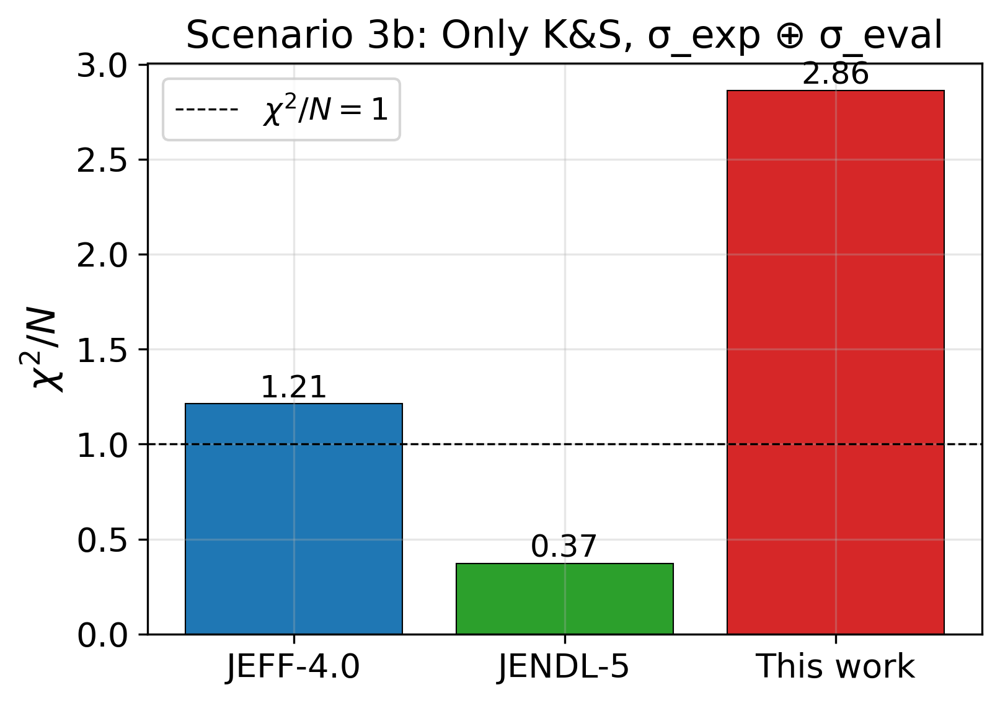


Per-experiment chi^2/N (sorted by avg, descending):

                                       JEFF  JENDL  This_work      N
experiment_id author year E_min E_max                               
10886002      Smith  1980 1.68  3.90  10.93   6.17       7.99    490
10571002      Kinney 1976 0.85  2.50   0.85   0.16       2.67  13208
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_per_experiment_histogram_3b.png


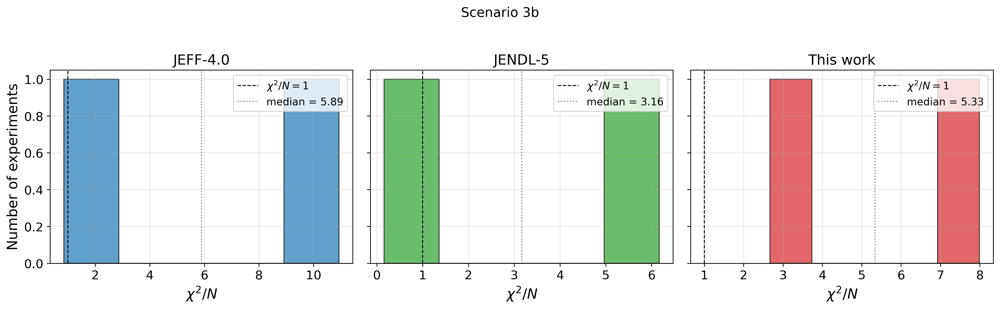

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_contribution_3b.png


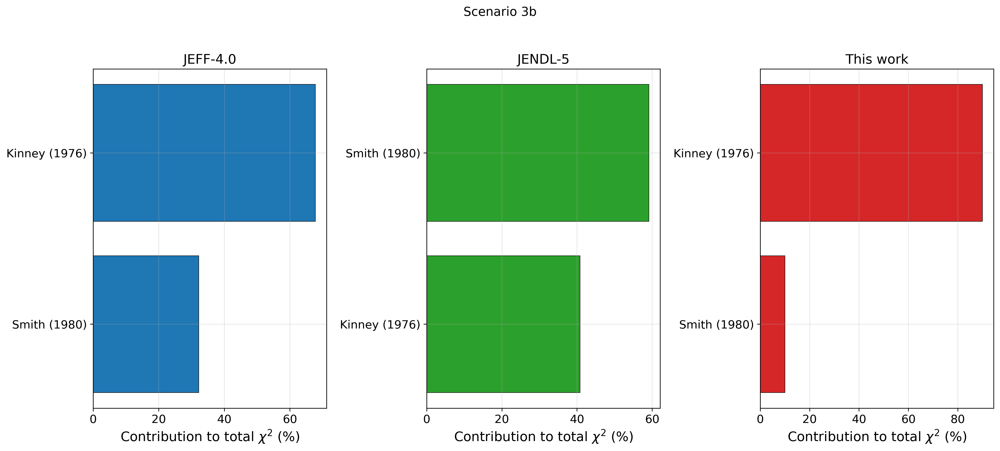

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_waterfall_3b.png


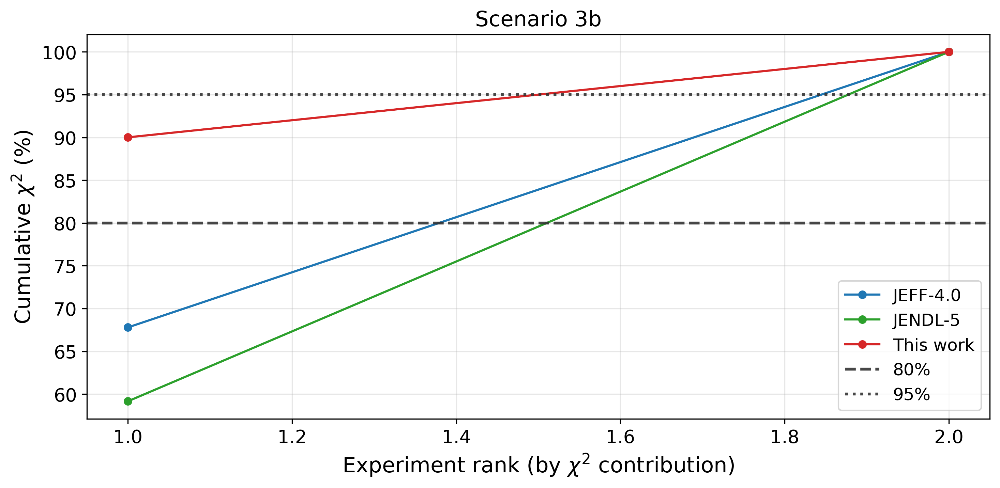

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_vs_year_3b.png


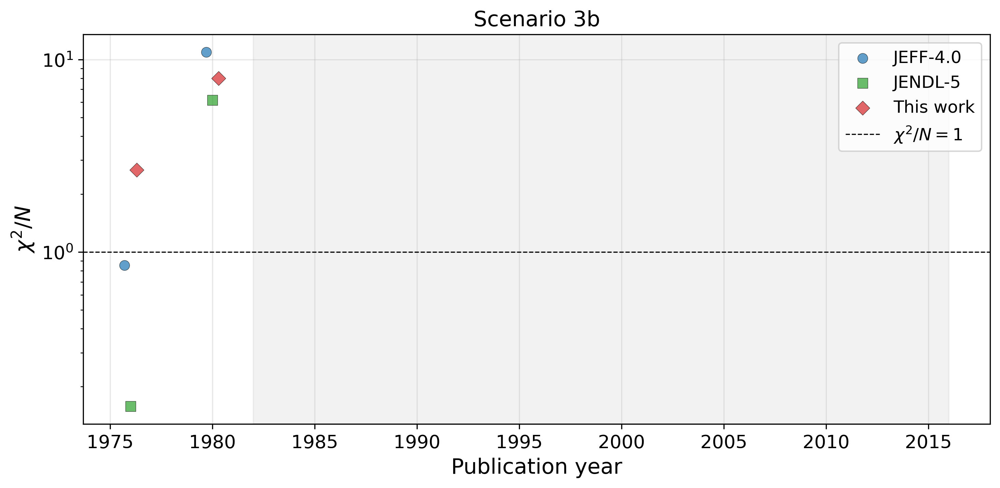


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library   mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 -0.038 1.101    -0.963    44.677      1.635      0.759
  JENDL-5 -0.019 0.610     3.840   335.632      0.891      0.482
This work -0.080 1.690     0.154    10.019     17.988      8.140
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_histograms_3b.png


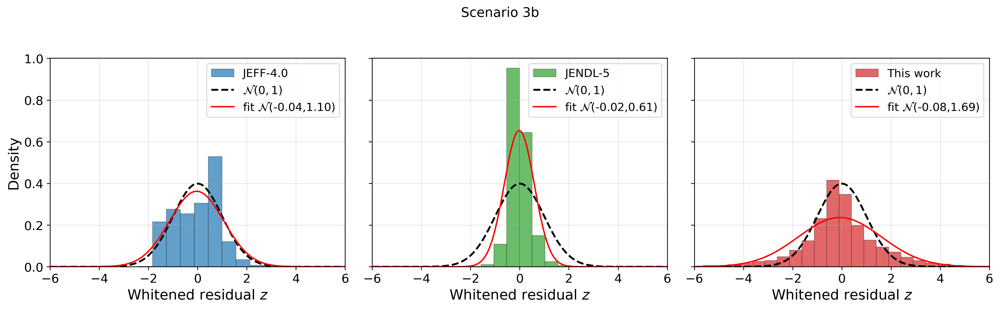

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/whitened_residual_vs_energy_3b.png


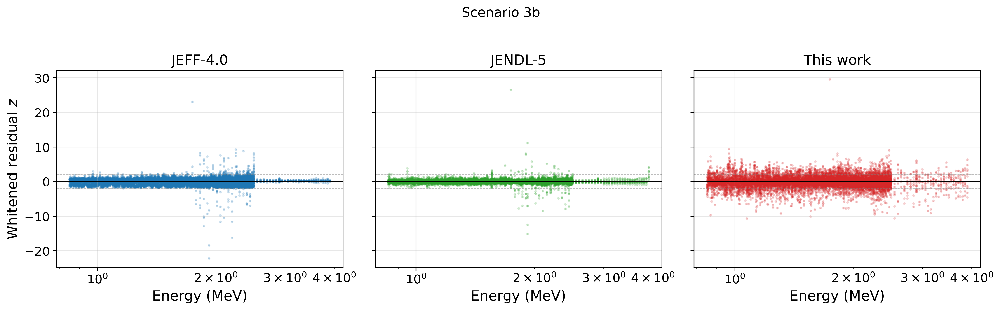

In [10]:
summary_3b = run_scenario(
    df_s=df_only_KS,
    scenario_key='3b',
    scenario_label='Only K&S, σ_exp ⊕ σ_eval',
    eval_cov_s=eval_cov,
)


## Per-subentry breakdown — Kinney 1976 vs Smith 1980 vs OTHER

Splits Mahalanobis $\chi^2/N$ by K&S label inside the full dataset, for both
variance budgets ($\sigma_\mathrm{exp}$ only and $\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$).


In [11]:
# ── Per-(library, ks_subentry) Mahalanobis chi^2/N ────────────────────────────


def _per_subentry_table(df_in, label, eval_cov_in):
    rows = []
    for ks_label in ['Kinney_1976', 'Smith_1980', 'OTHER']:
        sub_ks = df_in[df_in['ks_subentry'] == ks_label]
        if len(sub_ks) == 0:
            continue
        per_exp = chi2_metrics.mahalanobis_chi2_per_experiment(sub_ks, eval_cov_in)
        for lib in LIBRARIES:
            sl = per_exp[per_exp['library'] == lib]
            n = int(sl['N'].sum())
            chi2 = float(sl['chi2'].sum())
            rows.append({'subentry': ks_label, 'Library': LIB_LABELS[lib],
                         'N': n, 'chi2/N': chi2 / n if n > 0 else np.nan})
    per_exp_all = chi2_metrics.mahalanobis_chi2_per_experiment(df_in, eval_cov_in)
    for lib in LIBRARIES:
        sl = per_exp_all[per_exp_all['library'] == lib]
        n = int(sl['N'].sum())
        chi2 = float(sl['chi2'].sum())
        rows.append({'subentry': 'BOTH/ALL', 'Library': LIB_LABELS[lib],
                     'N': n, 'chi2/N': chi2 / n if n > 0 else np.nan})
    out = pd.DataFrame(rows)
    pivot = out.pivot_table(index='subentry', columns='Library', values='chi2/N', sort=False)
    pivot_n = out.pivot_table(index='subentry', columns='Library', values='N',
                              sort=False, aggfunc='first')
    first_lib = LIB_LABELS[LIBRARIES[0]]
    pivot.insert(0, 'N', pivot_n[first_lib].astype(int))
    print(f"\n{label}")
    print(pivot.to_string(float_format='%.3f'))


_per_subentry_table(df, 'σ_exp only:', None)
_per_subentry_table(df, 'σ_exp ⊕ σ_eval:', eval_cov)



σ_exp only:
Library          N  JEFF-4.0  JENDL-5  This work
subentry                                        
Kinney_1976  13208     1.816    0.303      6.403
Smith_1980     490    35.519   39.084     18.437
OTHER        33061  2033.514 2152.048    801.984
BOTH/ALL     46759  1438.683 1522.103    569.046

σ_exp ⊕ σ_eval:
Library          N  JEFF-4.0  JENDL-5  This work
subentry                                        
Kinney_1976  13208     0.854    0.158      2.672
Smith_1980     490    10.935    6.166      7.993
OTHER        33061     9.713   13.253      6.622
BOTH/ALL     46759     7.223    9.479      5.521


## Combined comparison — six scenarios side-by-side

Per-library Mahalanobis $\chi^2/N$ across the six scenarios. The drop from
$\sigma_\mathrm{exp}$-only (a) to $\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$ (b) shows
how much of the residual the propagated covariance absorbs.


COMBINED SUMMARY — Mahalanobis chi^2/N across the six scenarios

  Library  1a: all, exp  1b: all, exp+eval  2a: no_KS, exp  2b: no_KS, exp+eval  3a: only_KS, exp  3b: only_KS, exp+eval
 JEFF-4.0      1438.683              7.223        2033.514                9.713             3.021                  1.215
  JENDL-5      1522.103              9.479        2152.048               13.253             1.690                  0.373
This work       569.046              5.521         801.984                6.622             6.833                  2.862
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_exfor_c0/chi2_combined_comparison.png


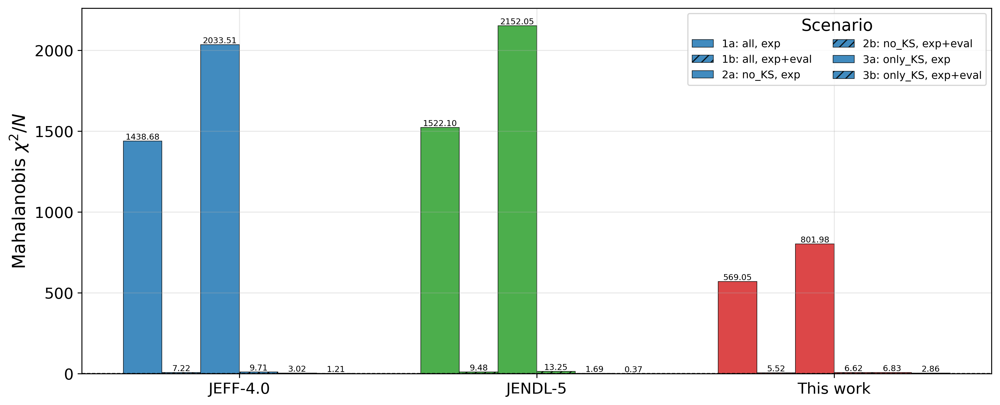


--- Best library per scenario ---
  1a: all, exp            -> This work
  1b: all, exp+eval       -> This work
  2a: no_KS, exp          -> This work
  2b: no_KS, exp+eval     -> This work
  3a: only_KS, exp        -> JENDL-5
  3b: only_KS, exp+eval   -> JENDL-5


In [12]:
# ── Combined summary table + grouped bar ─────────────────────────────────────

renamed = {
    '1a': '1a: all, exp',
    '1b': '1b: all, exp+eval',
    '2a': '2a: no_KS, exp',
    '2b': '2b: no_KS, exp+eval',
    '3a': '3a: only_KS, exp',
    '3b': '3b: only_KS, exp+eval',
}

combined = summary_1a.rename(columns={'chi2_per_N': renamed['1a'], 'N': 'N_1a'})
for key in ['1b', '2a', '2b', '3a', '3b']:
    s = globals()[f'summary_{key}'].rename(columns={'chi2_per_N': renamed[key], 'N': f'N_{key}'})
    combined = combined.merge(s, on=['Library', 'library_key'])

print("=" * 100)
print("COMBINED SUMMARY — Mahalanobis chi^2/N across the six scenarios")
print("=" * 100)
print()
print(combined[['Library'] + [renamed[k] for k in ['1a','1b','2a','2b','3a','3b']]]
      .to_string(index=False, float_format='%.3f'))

scenario_cols = [renamed[k] for k in ['1a', '1b', '2a', '2b', '3a', '3b']]
x = np.arange(len(LIBRARIES))
width = 0.13
hatches = ['', '///', '', '///', '', '///']

fig, ax = plt.subplots(figsize=(12, 5))
for i, scen in enumerate(scenario_cols):
    vals = [combined.loc[combined['library_key'] == lib, scen].values[0]
            for lib in LIBRARIES]
    bars = ax.bar(x + i * width, vals, width,
                  color=[LIB_COLORS[lib] for lib in LIBRARIES],
                  edgecolor='k', linewidth=0.5, alpha=0.85,
                  hatch=hatches[i], label=scen)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                f'{val:.2f}', ha='center', va='bottom', fontsize=7)

ax.set_xticks(x + 2.5 * width)
ax.set_xticklabels([LIB_LABELS[lib] for lib in LIBRARIES])
ax.set_ylabel(r'Mahalanobis $\chi^2 / N$')
ax.axhline(1.0, color='k', ls='--', lw=0.8)
ax.legend(title='Scenario', fontsize=9, ncol=2)
fig.tight_layout(); save_fig(fig, 'chi2_combined_comparison'); plt.show()

print("\n--- Best library per scenario ---")
for scen in scenario_cols:
    best_idx = combined[scen].idxmin()
    print(f"  {scen:22s}  -> {combined.loc[best_idx, 'Library']}")


In [13]:
print('Done.')


Done.
